# Adam(1e-5,1e-8) + l2(1e-4) + source(1~3) + batch(132) + focal-loss + dropout(all)(0.1) + Aug(False) + Freeze(conv1-conv4) + aug

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
import os
import time
import pickle

from sl_model import SL512, DSODSL512
from ssd_data import InputGenerator
from sl_utils import PriorUtil
from sl_training import SegLinkLoss, SegLinkFocalLoss

from utils.training import Logger, LearningRateDecay
from utils.model import load_weights, calc_memory_usage

Using TensorFlow backend.


### Data

In [2]:
from data_KSign_seglink import GTUtility

gt_util_ai_cr = GTUtility('data/K-SIGN/Annotation/', quality = 'cr')
gt_util_high = GTUtility('data/K-SIGN/HighQuality/', quality = 'high')

In [3]:
from data_cracker import GTUtility
gt_util_cr = GTUtility('data/KSIGNBOARD/')

/home/ina/anaconda3/envs/ina/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:768: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 2. Skipping tag 41493
  " Skipping tag %s" % (size, len(data), tag))
/home/ina/anaconda3/envs/ina/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:768: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 41988
  " Skipping tag %s" % (size, len(data), tag))


In [4]:
gt_util_merge = gt_util_ai_cr.merge(gt_util_high)
gt_util = gt_util_merge.merge(gt_util_cr)
print(gt_util)

Background              0
Text                 4940

images               1561
objects              4940
per image            3.16
no annotation           0



In [5]:
import pickle
file_name = 'gt_util_merge_dataset.pkl'
pickle.dump(gt_util, open(file_name,'wb'))

In [6]:
from ssd_data import BaseGTUtility

with open("gt_util_merge_dataset.pkl", 'rb') as f:
    gt_util = pickle.load(f)
    
gt_util_train, gt_util_val = BaseGTUtility.randomSplit(gt_util)

print(len(gt_util_train.image_names), len(gt_util_val.image_names))

1249 312


### Model

In [4]:
# SegLink
model = SL512(input_shape=(512, 512, 3), softmax=True)
weights_path= "./weights/201809231008_sl512_synthtext/weights.002.h5"
batch_size = 32

In [ ]:
if weights_path is not None:
    freeze = [
        'conv1_1', 'conv1_2',
        'conv2_1', 'conv2_2',
        'conv3_1', 'conv3_2', 'conv3_3',
        'conv4_1', 'conv4_2', 'conv4_3',
        #'conv5_1', 'conv5_2', 'conv5_3',
        
        #'fc6',
        #'fc7', # source 1
        
        #'conv6_1', 'conv6_2', # source 2
        #'conv7_1', 'conv7_2', # source 3
        #'conv8_1', 'conv8_2', # source 4
        #'conv9_1', 'conv9_2', # source 5
        #'conv10_1', 'conv10_2', # source 6
        
        #'conv4_3_norm_link_interlayer_conf', # source 1
        #'conv4_3_norm_link_crosslayer_conf',
        #'conv4_3_norm_mbox_conf',
        #'conv4_3_norm_mbox_loc',
        
        #'conv6_2_link_interlayer_conf', # source 2
        #'conv6_2_link_crosslayer_conf', 
        #'conv6_2_mbox_conf', 
        #'conv6_2_mbox_loc', 
        
        #'conv7_2_link_interlayer_conf', # source 3
        #'conv7_2_link_crosslayer_conf', 
        #'conv7_2_mbox_conf', 
        #'conv7_2_mbox_loc', 
        
        #'conv8_2_link_interlayer_conf', # source 4
        #'conv8_2_link_crosslayer_conf', 
        #'conv8_2_mbox_conf',
        #'conv8_2_mbox_loc',
        
        #'conv9_2_link_interlayer_conf', # source 5
        #'conv9_2_link_crosslayer_conf', 
        #'conv9_2_mbox_conf',
        #'conv9_2_mbox_loc', 
        
        #'conv10_2_link_interlayer_conf', # source 6
        #'conv10_2_link_crosslayer_conf', 
        #'conv10_2_mbox_conf',
        #'conv10_2_mbox_loc',
        
    ]
    
    load_weights(model, weights_path)
    for layer in model.layers:
        layer.trainable = not layer.name in freeze
        #if layer.trainable == True:
            #print(layer.name)
    

prior_util = PriorUtil(model)

layer missing input_1
    file  []


In [9]:
gen_train = InputGenerator(gt_util_train, prior_util, batch_size, model.image_size, augmentation=True)
gen_val = InputGenerator(gt_util_val, prior_util, batch_size, model.image_size, augmentation=False)

In [10]:
experiment = 'sl512_ksignboard_ex18'

checkdir = './checkpoints/' + experiment
if not os.path.exists(checkdir):
    os.makedirs(checkdir)

#with open(checkdir+'/source.py','wb') as f:
#    source = ''.join(['# In[%i]\n%s\n\n' % (i, In[i]) for i in range(len(In))])
#    f.write(source.encode())

# livelossplot
from livelossplot.keras import PlotLossesCallback

#EarlyStopping
from keras.callbacks import EarlyStopping

### Training

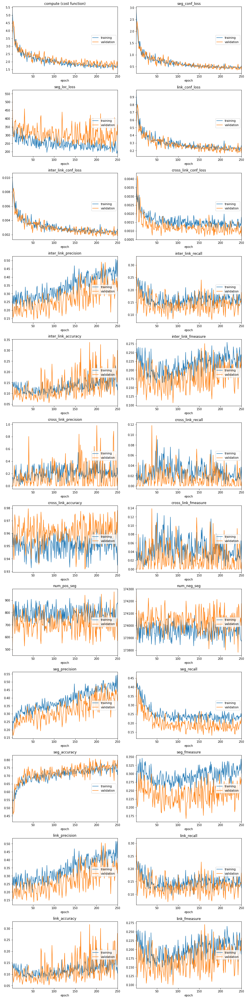

compute (cost function):
training   (min:    1.511, max:    5.364, cur:    1.819)
validation (min:    1.462, max:    4.635, cur:    1.725)

seg_conf_loss:
training   (min:    0.395, max:    2.916, cur:    0.532)
validation (min:    0.350, max:    2.415, cur:    0.371)

seg_loc_loss:
training   (min:  190.474, max:  389.217, cur:  205.736)
validation (min:  199.976, max:  555.696, cur:  362.535)

link_conf_loss:
training   (min:    0.191, max:    0.955, cur:    0.267)
validation (min:    0.165, max:    0.803, cur:    0.171)

inter_link_conf_loss:
training   (min:    0.002, max:    0.010, cur:    0.003)
validation (min:    0.002, max:    0.009, cur:    0.002)

cross_link_conf_loss:
training   (min:    0.001, max:    0.004, cur:    0.002)
validation (min:    0.001, max:    0.004, cur:    0.001)

inter_link_precision:
training   (min:    0.196, max:    0.509, cur:    0.405)
validation (min:    0.143, max:    0.491, cur:    0.316)

inter_link_recall:
training   (min:    0.107, max:    0.249

In [11]:
#optim = keras.optimizers.SGD(lr=1e-5, momentum=0.9, decay=1e-6, nesterov=True)
optim = keras.optimizers.Adam(lr=1e-5, beta_1=0.9, beta_2=0.999, epsilon=0.001, decay=1e-7)

# weight decay
regularizer = keras.regularizers.l2(5e-4) # None if disabled
#regularizer = None
for l in model.layers:
    if l.__class__.__name__.startswith('Conv'):
        l.kernel_regularizer = regularizer

#loss = SegLinkLoss(lambda_offsets=1.0, lambda_links=1.0, neg_pos_ratio=3.0)
#loss = SegLinkFocalLoss()
#loss = SegLinkFocalLoss(lambda_segments=1.0, lambda_offsets=1.0, lambda_links=1.0)
loss = SegLinkFocalLoss(gamma_segments=3, gamma_links=3)

model.compile(optimizer=optim, loss=loss.compute, metrics=loss.metrics)

history = model.fit_generator(
        gen_train.generate(), 
        steps_per_epoch=gen_train.num_batches, 
        epochs=250, 
        verbose=1,
        callbacks=[
            keras.callbacks.ModelCheckpoint(checkdir+'/weights.{epoch:03d}.h5', verbose=1, save_weights_only=True),
            Logger(checkdir),
            #LearningRateDecay(),
            PlotLossesCallback(),
            EarlyStopping(monitor='val_loss', mode='auto', restore_best_weights=True, verbose=1, patience=60)], 
        validation_data=gen_val.generate(), 
        validation_steps=gen_val.num_batches,
        class_weight=None,
        max_queue_size=1, 
        workers=8, 
        use_multiprocessing=True, 
        initial_epoch=0, 
        #pickle_safe=False, # will use threading instead of multiprocessing, which is lighter on memory use but slower
        )

In [12]:
model.load_weights('checkpoints/sl512_ksignboard_ex17/weights.170.h5')

In [25]:
segment_threshold = 0.4; link_threshold = 0.25
plot_name = 'sl512_ksignboard'

In [26]:
_, inputs, images, data = gt_util_val.sample_random_batch(batch_size=batch_size, input_size=model.image_size, seed=20)


preds = model.predict(inputs, batch_size=batch_size, verbose=1)

32/32 [==============================] - 0s 12ms/step


32


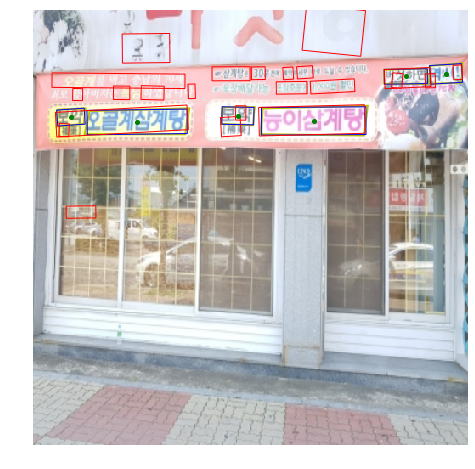

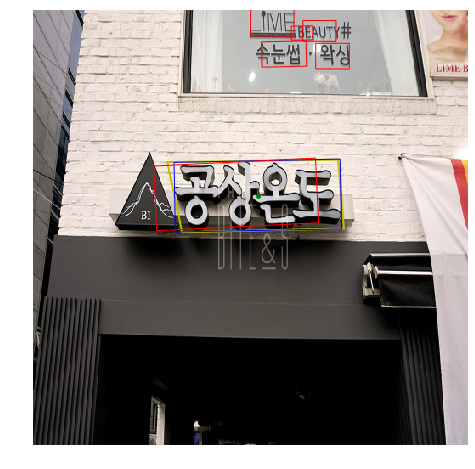

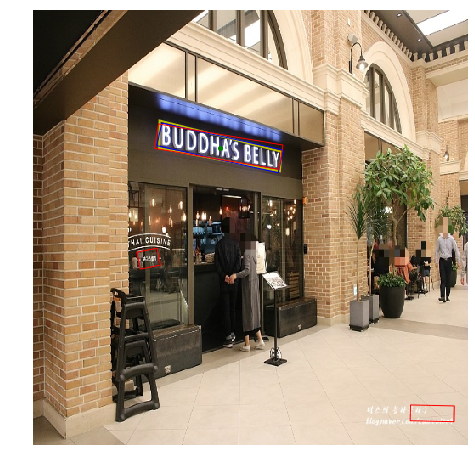

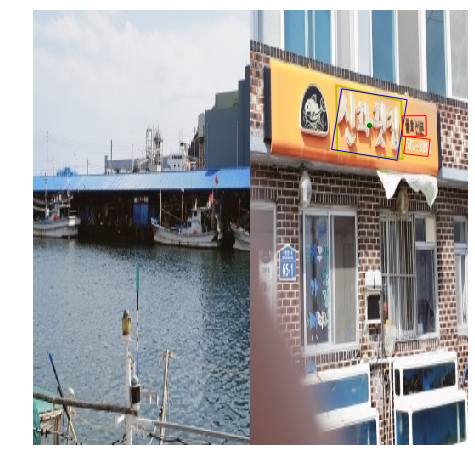

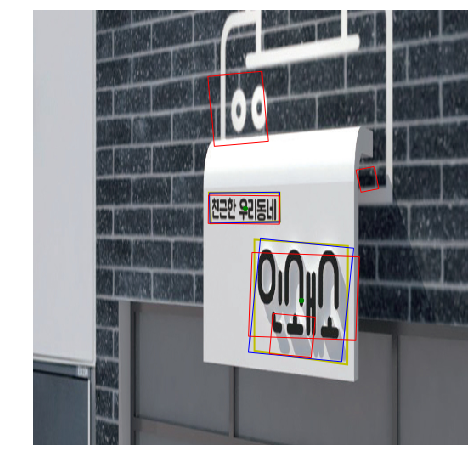

...

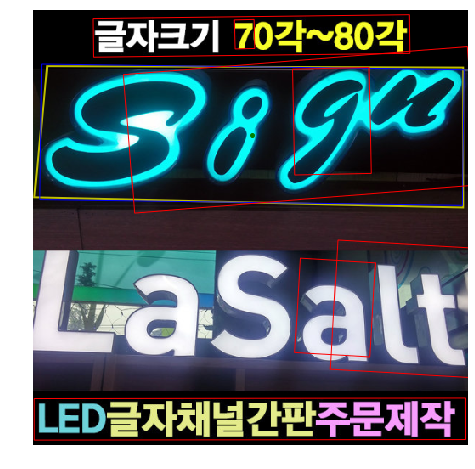

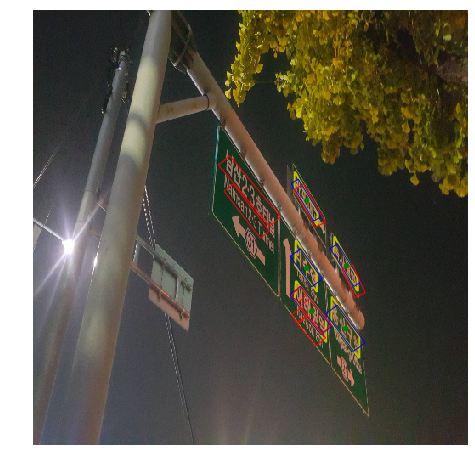

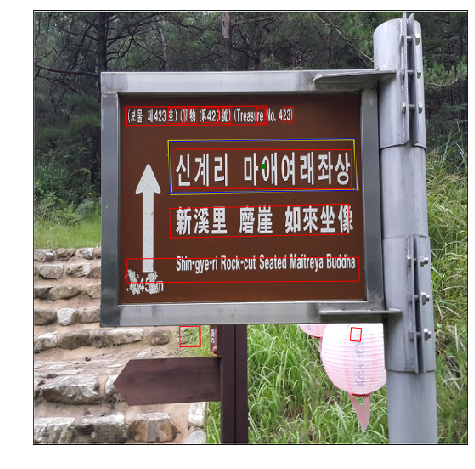

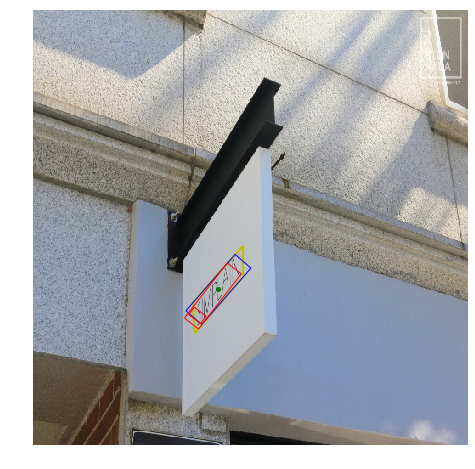

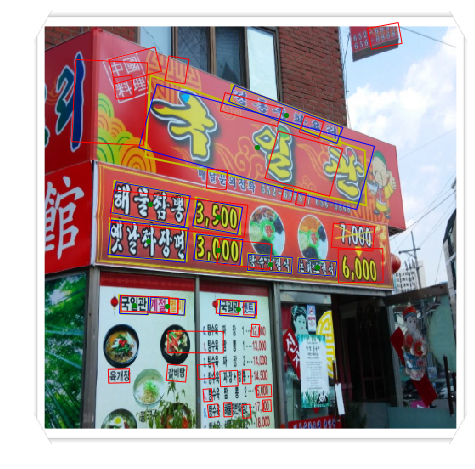

In [27]:
import glob

#checkdir = os.path.dirname(weights_path)

#for fl in glob.glob('%s/result_*' % (checkdir,)):
    #os.remove(fl)
#    pass

print(len(images))
#for i in range(4):
for i in range(batch_size):
    plt.figure(figsize=[8]*2)
    plt.imshow(images[i])
    res = prior_util.decode(preds[i], segment_threshold, link_threshold, debug=False)
    prior_util.encode(data[i])
    prior_util.plot_gt()
    prior_util.plot_results(res)
    plt.axis('off')
    #plt.savefig('%s/result_%03d.jpg' % (checkdir, i))
    plt.show()